In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#np.set_printoptions(threshold=sys.maxsize)

2022-12-14 21:18:38.179220: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-14 21:18:38.270074: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-12-14 21:18:38.292521: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-12-14 21:18:38.718869: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
config_directory = 'flow_edge'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
Model = model.Model(config_path)
DataProcessing = dataset.DataProcessing(config_path=config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.path_definitions()

2022-12-14 21:18:39.927382: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 21:18:39.931066: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 21:18:39.931168: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 21:18:39.931739: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 1332 images.
The TEST DS contains 100 images.


2022-12-14 21:18:48.630491: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


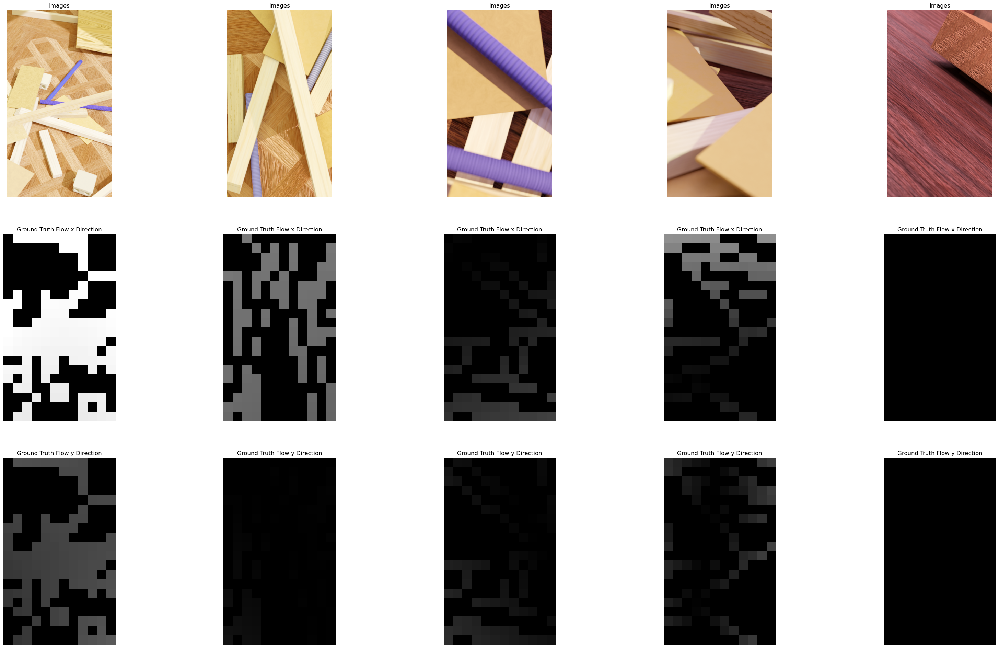

In [3]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

if Model.train_model:
    for inp, out in test_ds.take(1):
        edge_detection_plots.plot_flow_field(images=inp['in_img'], 
                                             flow_ground_truth=out['out_flow'], 
                                             batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])
        #edge_detection_plots.plot_edges(images=inp['in_img'],
        #                                prior = inp['in_edge'],
        #                                batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
        #                                num_classes=DataProcessing.num_classes['edge'])

# Define, Compile and Train Model

In [4]:
if Model.train_model:
    model = Model.get_neural_network_model(1)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(),
                  metrics=Model.get_metrics(1))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=train_ds,
                        callbacks=Model.get_callbacks(), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/200


2022-12-14 21:18:59.896124: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2022-12-14 21:19:00.881016: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


267/267 [==============================] - 26s 62ms/step - loss: 816.2219 - out_flow_loss: 17.3798 - out_edge_loss: 798.8425 - accuracy: 0.6762 - accuracy_1: 0.6762 - f1: 0.2247 - precision: 0.1567 - recall: 0.4921 - f1_1: 0.2247 - precision_1: 0.1567 - recall_1: 0.4921 - val_loss: 451.3338 - val_out_flow_loss: 16.4974 - val_out_edge_loss: 434.8365 - val_accuracy: 0.9149 - val_accuracy_1: 0.9149 - val_f1: 0.6081 - val_precision: 0.4925 - val_recall: 0.7945 - val_f1_1: 0.6081 - val_precision_1: 0.4925 - val_recall_1: 0.7945
Epoch 2/200
267/267 [==============================] - 16s 59ms/step - loss: 245.0471 - out_flow_loss: 15.2885 - out_edge_loss: 229.7585 - accuracy: 0.9508 - accuracy_1: 0.9508 - f1: 0.6630 - precision: 0.7613 - recall: 0.5875 - f1_1: 0.6630 - precision_1: 0.7613 - recall_1: 0.5875 - val_loss: 216.1431 - val_out_flow_loss: 14.3631 - val_out_edge_loss: 201.7801 - val_accuracy: 0.9586 - val_accuracy_1: 0.9586 - val_f1: 0.7393 - val_precision: 0.7754 - val_recall: 0.706

267/267 [==============================] - 16s 60ms/step - loss: 151.5764 - out_flow_loss: 6.8369 - out_edge_loss: 144.7396 - accuracy: 0.9702 - accuracy_1: 0.9702 - f1: 0.8142 - precision: 0.8428 - recall: 0.7875 - f1_1: 0.8142 - precision_1: 0.8428 - recall_1: 0.7875 - val_loss: 142.3534 - val_out_flow_loss: 6.1904 - val_out_edge_loss: 136.1630 - val_accuracy: 0.9723 - val_accuracy_1: 0.9723 - val_f1: 0.8254 - val_precision: 0.8667 - val_recall: 0.7878 - val_f1_1: 0.8254 - val_precision_1: 0.8667 - val_recall_1: 0.7878
Epoch 17/200
267/267 [==============================] - 16s 59ms/step - loss: 149.5056 - out_flow_loss: 6.3668 - out_edge_loss: 143.1389 - accuracy: 0.9711 - accuracy_1: 0.9711 - f1: 0.8209 - precision: 0.8453 - recall: 0.7980 - f1_1: 0.8209 - precision_1: 0.8453 - recall_1: 0.7980 - val_loss: 141.1167 - val_out_flow_loss: 6.5439 - val_out_edge_loss: 134.5728 - val_accuracy: 0.9726 - val_accuracy_1: 0.9726 - val_f1: 0.8300 - val_precision: 0.8582 - val_recall: 0.8035 -

267/267 [==============================] - 16s 59ms/step - loss: 138.0123 - out_flow_loss: 5.6305 - out_edge_loss: 132.3817 - accuracy: 0.9729 - accuracy_1: 0.9729 - f1: 0.8333 - precision: 0.8564 - recall: 0.8115 - f1_1: 0.8333 - precision_1: 0.8564 - recall_1: 0.8115 - val_loss: 133.7230 - val_out_flow_loss: 4.9267 - val_out_edge_loss: 128.7963 - val_accuracy: 0.9736 - val_accuracy_1: 0.9736 - val_f1: 0.8432 - val_precision: 0.8340 - val_recall: 0.8526 - val_f1_1: 0.8432 - val_precision_1: 0.8340 - val_recall_1: 0.8526
Epoch 32/200
267/267 [==============================] - 16s 59ms/step - loss: 138.6043 - out_flow_loss: 5.3511 - out_edge_loss: 133.2532 - accuracy: 0.9722 - accuracy_1: 0.9722 - f1: 0.8332 - precision: 0.8570 - recall: 0.8108 - f1_1: 0.8332 - precision_1: 0.8570 - recall_1: 0.8108 - val_loss: 135.3494 - val_out_flow_loss: 4.9947 - val_out_edge_loss: 130.3547 - val_accuracy: 0.9733 - val_accuracy_1: 0.9733 - val_f1: 0.8424 - val_precision: 0.8276 - val_recall: 0.8578 -

267/267 [==============================] - 16s 60ms/step - loss: 133.7117 - out_flow_loss: 4.4852 - out_edge_loss: 129.2265 - accuracy: 0.9733 - accuracy_1: 0.9733 - f1: 0.8390 - precision: 0.8626 - recall: 0.8167 - f1_1: 0.8390 - precision_1: 0.8626 - recall_1: 0.8167 - val_loss: 127.2052 - val_out_flow_loss: 4.1533 - val_out_edge_loss: 123.0518 - val_accuracy: 0.9750 - val_accuracy_1: 0.9750 - val_f1: 0.8468 - val_precision: 0.8640 - val_recall: 0.8303 - val_f1_1: 0.8468 - val_precision_1: 0.8640 - val_recall_1: 0.8303
Epoch 47/200
267/267 [==============================] - 16s 61ms/step - loss: 131.9690 - out_flow_loss: 4.3253 - out_edge_loss: 127.6437 - accuracy: 0.9741 - accuracy_1: 0.9741 - f1: 0.8381 - precision: 0.8595 - recall: 0.8178 - f1_1: 0.8381 - precision_1: 0.8595 - recall_1: 0.8178 - val_loss: 130.6265 - val_out_flow_loss: 4.4169 - val_out_edge_loss: 126.2095 - val_accuracy: 0.9746 - val_accuracy_1: 0.9746 - val_f1: 0.8379 - val_precision: 0.8929 - val_recall: 0.7892 -

267/267 [==============================] - 16s 60ms/step - loss: 129.9831 - out_flow_loss: 3.9008 - out_edge_loss: 126.0822 - accuracy: 0.9749 - accuracy_1: 0.9749 - f1: 0.8442 - precision: 0.8605 - recall: 0.8287 - f1_1: 0.8442 - precision_1: 0.8605 - recall_1: 0.8287 - val_loss: 127.1094 - val_out_flow_loss: 3.6550 - val_out_edge_loss: 123.4545 - val_accuracy: 0.9751 - val_accuracy_1: 0.9751 - val_f1: 0.8418 - val_precision: 0.8931 - val_recall: 0.7962 - val_f1_1: 0.8418 - val_precision_1: 0.8931 - val_recall_1: 0.7962
Epoch 62/200
267/267 [==============================] - 16s 60ms/step - loss: 128.1908 - out_flow_loss: 3.7884 - out_edge_loss: 124.4025 - accuracy: 0.9747 - accuracy_1: 0.9747 - f1: 0.8447 - precision: 0.8638 - recall: 0.8265 - f1_1: 0.8447 - precision_1: 0.8638 - recall_1: 0.8265 - val_loss: 124.3760 - val_out_flow_loss: 3.7943 - val_out_edge_loss: 120.5817 - val_accuracy: 0.9756 - val_accuracy_1: 0.9756 - val_f1: 0.8519 - val_precision: 0.8597 - val_recall: 0.8442 -

267/267 [==============================] - 16s 60ms/step - loss: 126.2210 - out_flow_loss: 3.2656 - out_edge_loss: 122.9554 - accuracy: 0.9746 - accuracy_1: 0.9746 - f1: 0.8431 - precision: 0.8604 - recall: 0.8266 - f1_1: 0.8431 - precision_1: 0.8604 - recall_1: 0.8266 - val_loss: 122.4279 - val_out_flow_loss: 3.3505 - val_out_edge_loss: 119.0774 - val_accuracy: 0.9759 - val_accuracy_1: 0.9759 - val_f1: 0.8535 - val_precision: 0.8617 - val_recall: 0.8454 - val_f1_1: 0.8535 - val_precision_1: 0.8617 - val_recall_1: 0.8454
Epoch 77/200
267/267 [==============================] - 16s 60ms/step - loss: 126.2019 - out_flow_loss: 3.5512 - out_edge_loss: 122.6507 - accuracy: 0.9756 - accuracy_1: 0.9756 - f1: 0.8522 - precision: 0.8707 - recall: 0.8345 - f1_1: 0.8522 - precision_1: 0.8707 - recall_1: 0.8345 - val_loss: 122.3795 - val_out_flow_loss: 3.4239 - val_out_edge_loss: 118.9557 - val_accuracy: 0.9759 - val_accuracy_1: 0.9759 - val_f1: 0.8510 - val_precision: 0.8753 - val_recall: 0.8280 -

267/267 [==============================] - 16s 62ms/step - loss: 124.3960 - out_flow_loss: 3.2388 - out_edge_loss: 121.1572 - accuracy: 0.9756 - accuracy_1: 0.9756 - f1: 0.8497 - precision: 0.8696 - recall: 0.8307 - f1_1: 0.8497 - precision_1: 0.8696 - recall_1: 0.8307 - val_loss: 120.1617 - val_out_flow_loss: 2.9277 - val_out_edge_loss: 117.2340 - val_accuracy: 0.9763 - val_accuracy_1: 0.9763 - val_f1: 0.8546 - val_precision: 0.8715 - val_recall: 0.8384 - val_f1_1: 0.8546 - val_precision_1: 0.8715 - val_recall_1: 0.8384
Epoch 92/200
267/267 [==============================] - 16s 60ms/step - loss: 124.5988 - out_flow_loss: 3.2934 - out_edge_loss: 121.3053 - accuracy: 0.9766 - accuracy_1: 0.9766 - f1: 0.8484 - precision: 0.8666 - recall: 0.8309 - f1_1: 0.8484 - precision_1: 0.8666 - recall_1: 0.8309 - val_loss: 120.4726 - val_out_flow_loss: 2.8925 - val_out_edge_loss: 117.5801 - val_accuracy: 0.9762 - val_accuracy_1: 0.9762 - val_f1: 0.8554 - val_precision: 0.8639 - val_recall: 0.8470 -

267/267 [==============================] - 16s 60ms/step - loss: 122.3050 - out_flow_loss: 2.8700 - out_edge_loss: 119.4351 - accuracy: 0.9749 - accuracy_1: 0.9749 - f1: 0.8527 - precision: 0.8737 - recall: 0.8328 - f1_1: 0.8527 - precision_1: 0.8737 - recall_1: 0.8328 - val_loss: 118.5585 - val_out_flow_loss: 2.7165 - val_out_edge_loss: 115.8420 - val_accuracy: 0.9765 - val_accuracy_1: 0.9765 - val_f1: 0.8546 - val_precision: 0.8785 - val_recall: 0.8320 - val_f1_1: 0.8546 - val_precision_1: 0.8785 - val_recall_1: 0.8320
Epoch 107/200
267/267 [==============================] - 16s 60ms/step - loss: 122.6100 - out_flow_loss: 2.8177 - out_edge_loss: 119.7923 - accuracy: 0.9762 - accuracy_1: 0.9762 - f1: 0.8544 - precision: 0.8728 - recall: 0.8369 - f1_1: 0.8544 - precision_1: 0.8728 - recall_1: 0.8369 - val_loss: 118.6889 - val_out_flow_loss: 2.8929 - val_out_edge_loss: 115.7960 - val_accuracy: 0.9766 - val_accuracy_1: 0.9766 - val_f1: 0.8565 - val_precision: 0.8728 - val_recall: 0.8407 

267/267 [==============================] - 16s 60ms/step - loss: 121.9619 - out_flow_loss: 2.9142 - out_edge_loss: 119.0477 - accuracy: 0.9759 - accuracy_1: 0.9759 - f1: 0.8543 - precision: 0.8742 - recall: 0.8354 - f1_1: 0.8543 - precision_1: 0.8742 - recall_1: 0.8354 - val_loss: 118.0583 - val_out_flow_loss: 2.6433 - val_out_edge_loss: 115.4150 - val_accuracy: 0.9766 - val_accuracy_1: 0.9766 - val_f1: 0.8552 - val_precision: 0.8817 - val_recall: 0.8303 - val_f1_1: 0.8552 - val_precision_1: 0.8817 - val_recall_1: 0.8303
Epoch 122/200
267/267 [==============================] - 16s 59ms/step - loss: 121.4825 - out_flow_loss: 3.0178 - out_edge_loss: 118.4646 - accuracy: 0.9770 - accuracy_1: 0.9770 - f1: 0.8571 - precision: 0.8746 - recall: 0.8404 - f1_1: 0.8571 - precision_1: 0.8746 - recall_1: 0.8404 - val_loss: 119.7806 - val_out_flow_loss: 2.6373 - val_out_edge_loss: 117.1433 - val_accuracy: 0.9764 - val_accuracy_1: 0.9764 - val_f1: 0.8588 - val_precision: 0.8523 - val_recall: 0.8655 

267/267 [==============================] - 17s 62ms/step - loss: 120.0350 - out_flow_loss: 2.5679 - out_edge_loss: 117.4672 - accuracy: 0.9757 - accuracy_1: 0.9757 - f1: 0.8493 - precision: 0.8700 - recall: 0.8296 - f1_1: 0.8493 - precision_1: 0.8700 - recall_1: 0.8296 - val_loss: 116.3839 - val_out_flow_loss: 2.4038 - val_out_edge_loss: 113.9800 - val_accuracy: 0.9769 - val_accuracy_1: 0.9769 - val_f1: 0.8586 - val_precision: 0.8738 - val_recall: 0.8440 - val_f1_1: 0.8586 - val_precision_1: 0.8738 - val_recall_1: 0.8440
Epoch 137/200
267/267 [==============================] - 16s 61ms/step - loss: 119.5394 - out_flow_loss: 2.5630 - out_edge_loss: 116.9764 - accuracy: 0.9765 - accuracy_1: 0.9765 - f1: 0.8565 - precision: 0.8745 - recall: 0.8393 - f1_1: 0.8565 - precision_1: 0.8745 - recall_1: 0.8393 - val_loss: 116.9174 - val_out_flow_loss: 2.8075 - val_out_edge_loss: 114.1099 - val_accuracy: 0.9769 - val_accuracy_1: 0.9769 - val_f1: 0.8574 - val_precision: 0.8817 - val_recall: 0.8344 

267/267 [==============================] - 16s 60ms/step - loss: 119.2844 - out_flow_loss: 2.3392 - out_edge_loss: 116.9452 - accuracy: 0.9769 - accuracy_1: 0.9769 - f1: 0.8555 - precision: 0.8714 - recall: 0.8404 - f1_1: 0.8555 - precision_1: 0.8714 - recall_1: 0.8404 - val_loss: 116.0905 - val_out_flow_loss: 2.2833 - val_out_edge_loss: 113.8072 - val_accuracy: 0.9771 - val_accuracy_1: 0.9771 - val_f1: 0.8597 - val_precision: 0.8742 - val_recall: 0.8457 - val_f1_1: 0.8597 - val_precision_1: 0.8742 - val_recall_1: 0.8457
Epoch 152/200
267/267 [==============================] - 16s 61ms/step - loss: 120.3790 - out_flow_loss: 2.4531 - out_edge_loss: 117.9260 - accuracy: 0.9763 - accuracy_1: 0.9763 - f1: 0.8532 - precision: 0.8721 - recall: 0.8353 - f1_1: 0.8532 - precision_1: 0.8721 - recall_1: 0.8353 - val_loss: 115.8326 - val_out_flow_loss: 2.3523 - val_out_edge_loss: 113.4804 - val_accuracy: 0.9770 - val_accuracy_1: 0.9770 - val_f1: 0.8608 - val_precision: 0.8669 - val_recall: 0.8547 

267/267 [==============================] - 16s 59ms/step - loss: 118.6111 - out_flow_loss: 2.3246 - out_edge_loss: 116.2865 - accuracy: 0.9766 - accuracy_1: 0.9766 - f1: 0.8541 - precision: 0.8743 - recall: 0.8348 - f1_1: 0.8541 - precision_1: 0.8743 - recall_1: 0.8348 - val_loss: 115.0625 - val_out_flow_loss: 2.3281 - val_out_edge_loss: 112.7344 - val_accuracy: 0.9772 - val_accuracy_1: 0.9772 - val_f1: 0.8597 - val_precision: 0.8799 - val_recall: 0.8404 - val_f1_1: 0.8597 - val_precision_1: 0.8799 - val_recall_1: 0.8404
Epoch 167/200
267/267 [==============================] - 16s 59ms/step - loss: 118.0048 - out_flow_loss: 2.4064 - out_edge_loss: 115.5984 - accuracy: 0.9771 - accuracy_1: 0.9771 - f1: 0.8556 - precision: 0.8715 - recall: 0.8405 - f1_1: 0.8556 - precision_1: 0.8715 - recall_1: 0.8405 - val_loss: 115.1109 - val_out_flow_loss: 2.2152 - val_out_edge_loss: 112.8957 - val_accuracy: 0.9772 - val_accuracy_1: 0.9772 - val_f1: 0.8604 - val_precision: 0.8754 - val_recall: 0.8459 

267/267 [==============================] - 16s 60ms/step - loss: 117.6350 - out_flow_loss: 2.2044 - out_edge_loss: 115.4306 - accuracy: 0.9767 - accuracy_1: 0.9767 - f1: 0.8563 - precision: 0.8727 - recall: 0.8405 - f1_1: 0.8563 - precision_1: 0.8727 - recall_1: 0.8405 - val_loss: 114.1926 - val_out_flow_loss: 2.0838 - val_out_edge_loss: 112.1088 - val_accuracy: 0.9772 - val_accuracy_1: 0.9772 - val_f1: 0.8605 - val_precision: 0.8770 - val_recall: 0.8447 - val_f1_1: 0.8605 - val_precision_1: 0.8770 - val_recall_1: 0.8447
Epoch 182/200
267/267 [==============================] - 16s 60ms/step - loss: 117.9249 - out_flow_loss: 2.2230 - out_edge_loss: 115.7019 - accuracy: 0.9761 - accuracy_1: 0.9761 - f1: 0.8542 - precision: 0.8733 - recall: 0.8360 - f1_1: 0.8542 - precision_1: 0.8733 - recall_1: 0.8360 - val_loss: 114.4037 - val_out_flow_loss: 2.0793 - val_out_edge_loss: 112.3245 - val_accuracy: 0.9772 - val_accuracy_1: 0.9772 - val_f1: 0.8610 - val_precision: 0.8747 - val_recall: 0.8477 

267/267 [==============================] - 16s 59ms/step - loss: 116.0040 - out_flow_loss: 2.1679 - out_edge_loss: 113.8360 - accuracy: 0.9775 - accuracy_1: 0.9775 - f1: 0.8611 - precision: 0.8774 - recall: 0.8455 - f1_1: 0.8611 - precision_1: 0.8774 - recall_1: 0.8455 - val_loss: 114.2514 - val_out_flow_loss: 2.0335 - val_out_edge_loss: 112.2180 - val_accuracy: 0.9773 - val_accuracy_1: 0.9773 - val_f1: 0.8618 - val_precision: 0.8712 - val_recall: 0.8525 - val_f1_1: 0.8618 - val_precision_1: 0.8712 - val_recall_1: 0.8525
Epoch 197/200
267/267 [==============================] - 16s 60ms/step - loss: 117.3672 - out_flow_loss: 2.0737 - out_edge_loss: 115.2935 - accuracy: 0.9766 - accuracy_1: 0.9766 - f1: 0.8607 - precision: 0.8772 - recall: 0.8448 - f1_1: 0.8607 - precision_1: 0.8772 - recall_1: 0.8448 - val_loss: 114.2298 - val_out_flow_loss: 1.9868 - val_out_edge_loss: 112.2430 - val_accuracy: 0.9773 - val_accuracy_1: 0.9773 - val_f1: 0.8626 - val_precision: 0.8679 - val_recall: 0.8573 

OSError: Unable to load model. Filepath is not an hdf5 file (or h5py is not available) or SavedModel. Received: filepath=None

1/1 [==============================] - 0s 24ms/step


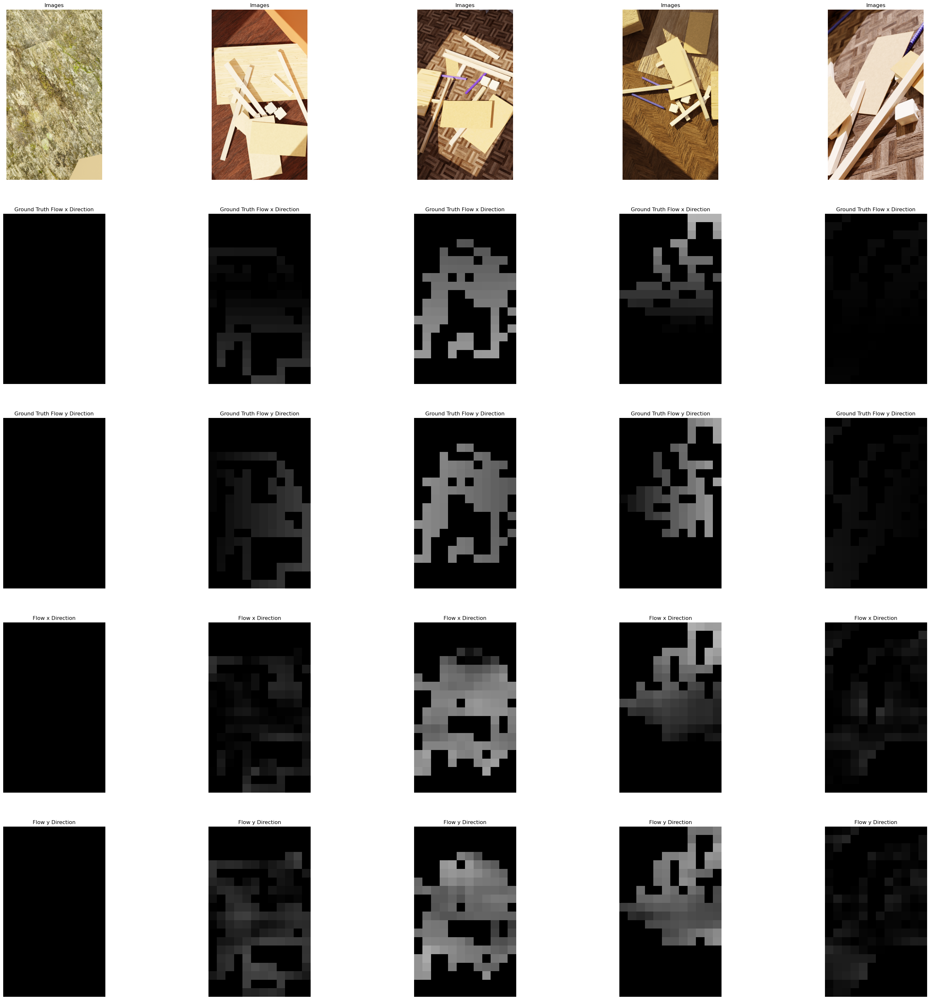

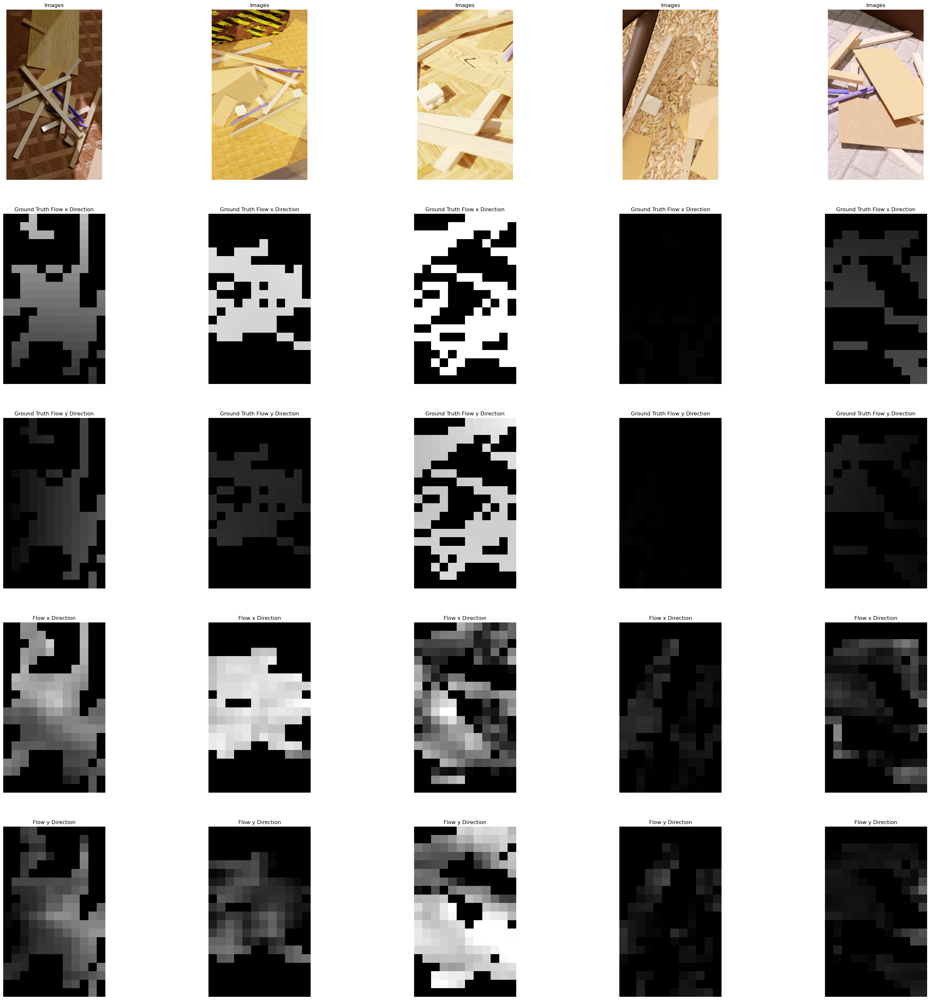

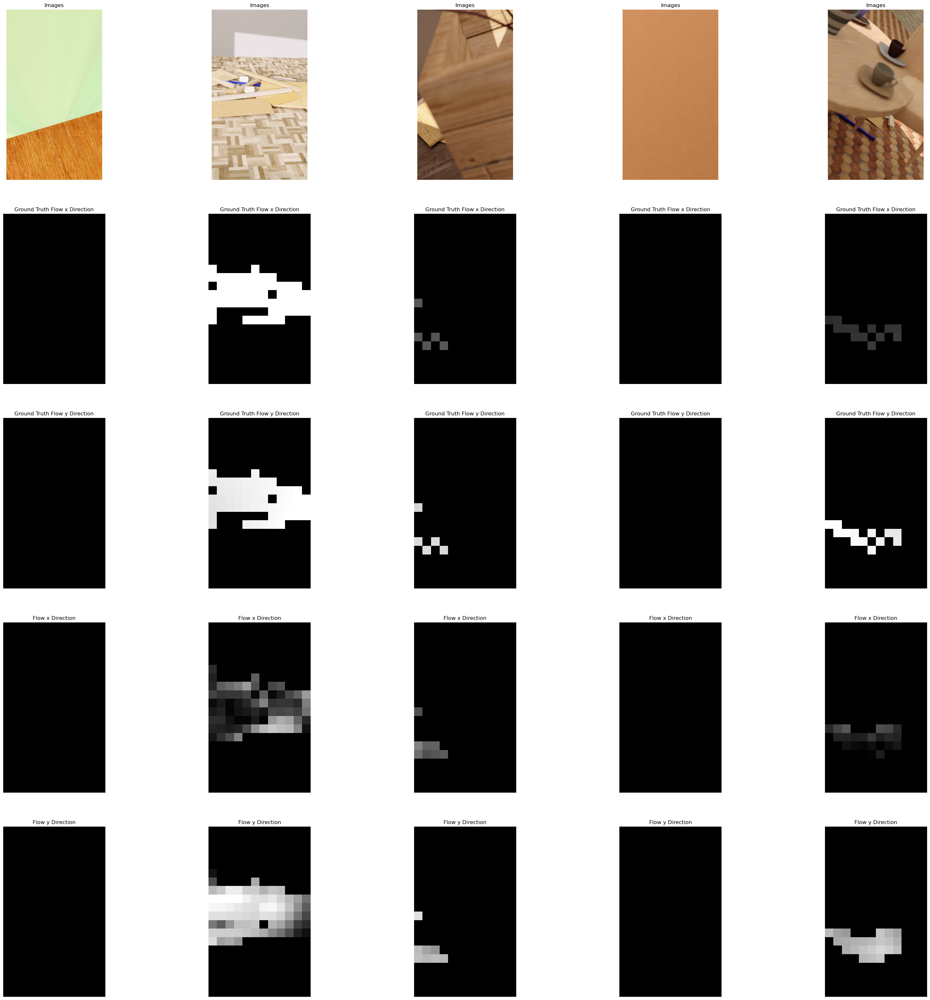

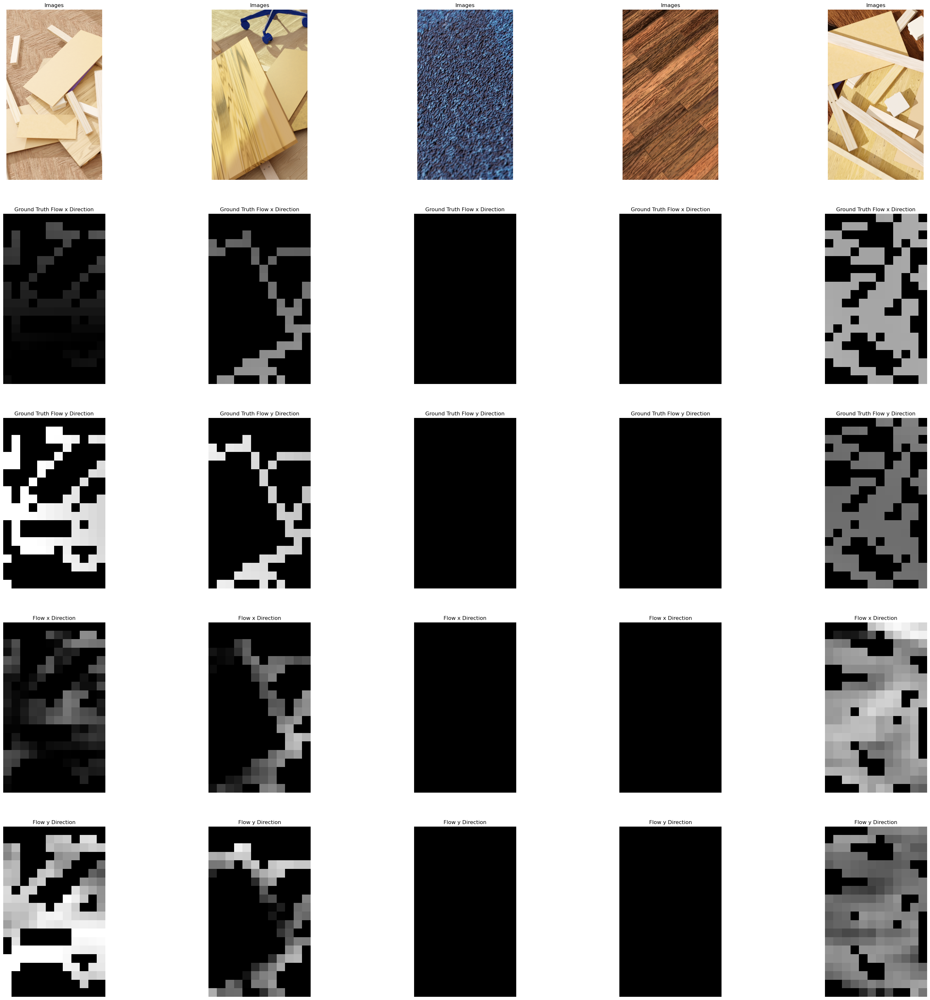

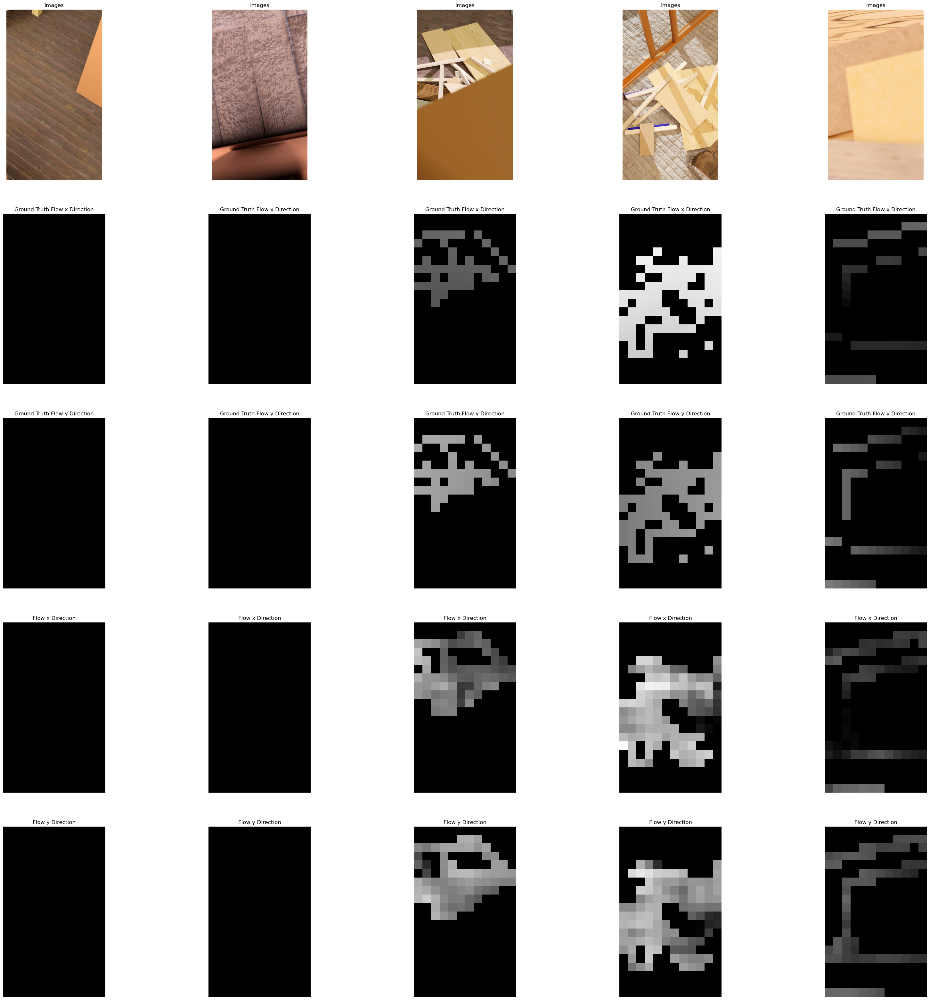

In [5]:
for inp, out in train_ds.take(5):
    pred = model.predict(inp)
    edge_detection_plots.plot_flow_field(images=inp['in_img'], 
                                         flow_ground_truth=out['out_flow'],
                                         flow_prediction=pred[0],
                                         batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

1/1 [==============================] - 0s 76ms/step


2022-12-14 22:18:05.777375: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


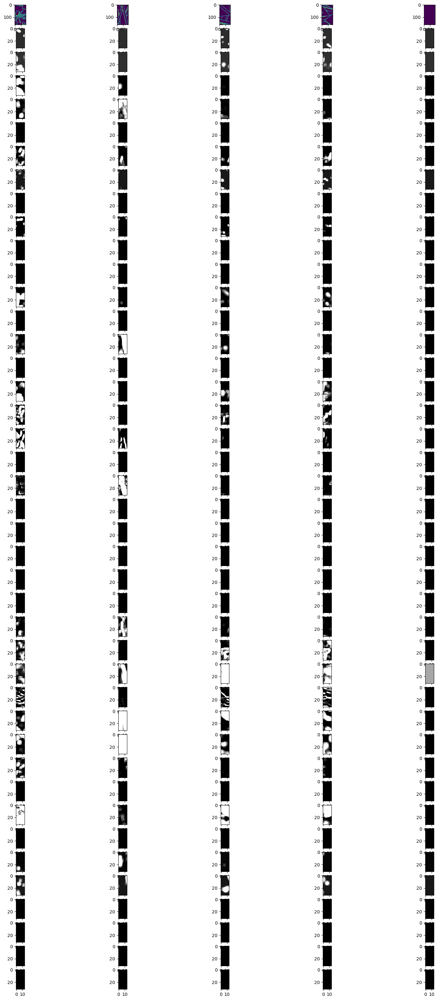

In [6]:
plt.figure(figsize=(20,40))

output = 2 # pyramid_out
num = 41
batch = 5
for inp, out in test_ds.take(1):
    pred = model.predict(inp)
    out_pred = pred[output]
    for i in range(batch):
        plt.subplot(num+1, batch, i + 1)
        plt.imshow((inp["in_edge"][i,:,:,0]))
        for j in range(num):
            plt.subplot(num+1, batch, batch*(1+j) + i + 1)
            plt.imshow(out_pred[i,:,:,j], cmap='gray', vmin=0, vmax=0.5)
plt.show()

In [ ]:
model.summary()


tf.keras.utils.plot_model(
    model,
    to_file=Model.Data.paths['FIGURES']+"/model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

# Plot Results

In [ ]:
if Model.train_model:
    plot_losses = ["loss", "loss"]
    plot_metrics = ["accuracy", "f1", "recall", "precision"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training.svg")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

In [ ]:
for inp, out in test_ds.take(1):
    pred = model.predict(inp)
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    labels=out['out_edge'],
                                    predictions=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                    num_classes=DataProcessing.num_classes['edge'])

In [ ]:
### Maximum F1 Score:
path_metrics_evaluation_plot = os.path.join(Model.Data.paths["FIGURES"],
                                            "threshold_metrics_evaluation_test_ds.svg")

edge_detection_plots.plot_threshold_metrics_evaluation(model=model, ds=test_ds,
                                                       num_classes=DataProcessing.num_classes['edge'],
                                                       classes_displayed_individually=True,
                                                       save=Model.cfg["SAVE"],
                                                       path=path_metrics_evaluation_plot,
                                                       accuracy_y_lim_min=0.8)


In [ ]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)